## Syllabus
- Faster RCNN
- YOLOv3
- Mask RCNN
- OCR
- Stable Diffusion

## Faster RCNN

In [ ]:
#prepare the utils from torchvision framework
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_utils.py

--2023-05-22 12:27:16--  https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 23337 (23K) [text/plain]
Saving to: ‘transforms.py’

transforms.py       100%[===================>]  22.79K  --.-KB/s    in 0s      

2023-05-22 12:27:17 (66.2 MB/s) - ‘transforms.py’ saved [23337/23337]

--2023-05-22 12:27:17--  https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4032 (3.9K)

In [ ]:
# prepare the datasets
!wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
!unzip PennFudanPed.zip -d PennFudanPed

--2023-05-22 12:27:18--  https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
Resolving www.cis.upenn.edu (www.cis.upenn.edu)... 158.130.69.163, 2607:f470:8:64:5ea5::d
Connecting to www.cis.upenn.edu (www.cis.upenn.edu)|158.130.69.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53723336 (51M) [application/zip]
Saving to: ‘PennFudanPed.zip’

PennFudanPed.zip    100%[===================>]  51.23M  27.4MB/s    in 1.9s    

2023-05-22 12:27:20 (27.4 MB/s) - ‘PennFudanPed.zip’ saved [53723336/53723336]

Archive:  PennFudanPed.zip
   creating: PennFudanPed/PennFudanPed/
  inflating: PennFudanPed/PennFudanPed/added-object-list.txt  
   creating: PennFudanPed/PennFudanPed/Annotation/
  inflating: PennFudanPed/PennFudanPed/Annotation/FudanPed00001.txt  
  inflating: PennFudanPed/PennFudanPed/Annotation/FudanPed00002.txt  
  inflating: PennFudanPed/PennFudanPed/Annotation/FudanPed00003.txt  
  inflating: PennFudanPed/PennFudanPed/Annotation/FudanPed00004.txt  


In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import torch

In [ ]:
DATA_PATH = 'PennFudanPed/PennFudanPed/'
os.listdir(DATA_PATH)

['Annotation', 'PedMasks', 'added-object-list.txt', 'readme.txt', 'PNGImages']

In [ ]:
# code is from https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
class PennFudanDataset(torch.utils.data.Dataset):
  def __init__(self, root, transforms=None):
    self.root = root
    self.transforms = transforms #preprocessing
    self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
    self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

  def __getitem__(self, idx):
    img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
    mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
    img = Image.open(img_path).convert('RGB')
    mask = Image.open(mask_path)

    mask = np.array(mask)
    obj_ids = np.unique(mask) #object id dari masing -> 0 1 2

    obj_ids = obj_ids[1:] #kita menghilangkan background (index 0) pada obj_ids -> 1 dan 2

    mask_filter = mask == obj_ids[:, None, None] #kita filter si mask ngedaptin value yang ada nilai object id, array of boolean
    num_objs = len(obj_ids)
    boxes = []
    for i in range(num_objs):
      pos = np.where(mask_filter[i]) #untuk ngeget nilai index x and y dari kondisi true
      xmin = np.min(pos[1])
      xmax = np.max(pos[1])
      ymin = np.min(pos[0])
      ymax = np.max(pos[0])
      boxes.append([xmin, ymin, xmax, ymax])
    
    #convert everything to tensor
    boxes = torch.as_tensor(boxes, dtype=torch.float32)
    labels = torch.ones((num_objs,), dtype=torch.int64)

    image_id = torch.tensor([idx])
    area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) #rumus luas persegi
    is_crowd = torch.zeros((num_objs,), dtype=torch.int64)

    target = {}
    target['boxes'] = boxes
    target['labels'] = labels
    target['image_id'] = image_id
    target['area'] = area
    target['iscrowd'] = is_crowd

    if self.transforms is not None:
      img, target = self.transforms(img, target)

    return img, target
  
  def __len__(self):
    return len(self.imgs)


In [ ]:
data = PennFudanDataset(DATA_PATH)

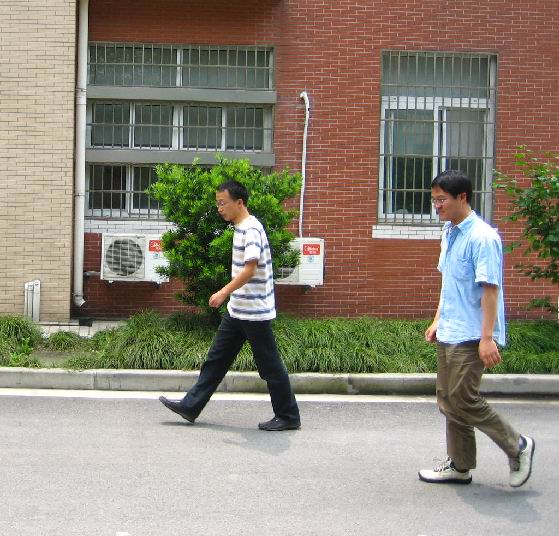

In [ ]:
data[0][0]

In [ ]:
data[0][1]

{'boxes': tensor([[159., 181., 301., 430.],
         [419., 170., 534., 485.]]),
 'labels': tensor([1, 1]),
 'image_id': tensor([0]),
 'area': tensor([35358., 36225.]),
 'iscrowd': tensor([0, 0])}

In [ ]:
# code is from https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
import transforms as T

def get_transform(train):
  transforms = []
  transforms.append(T.PILToTensor())
  transforms.append(T.ConvertImageDtype(torch.float)) #normalisasi
  if train:
    transforms.append(T.RandomHorizontalFlip(0.5))
  
  return T.Compose(transforms)

In [ ]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT") #91 

num_class = 2 #background + person

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_class)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 251MB/s]


In [ ]:
# code is from https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
from engine import train_one_epoch, evaluate
import utils

def train():
  device = "cuda" if torch.cuda.is_available() else "cpu"

  num_class = 2
  dataset = PennFudanDataset(DATA_PATH, get_transform(train=True))
  dataset_test = PennFudanDataset(DATA_PATH, get_transform(train=False))

  #split_train_test
  indices = torch.randperm(len(dataset)).tolist() # randperm(5) -> 0 2 3 1 4
  dataset = torch.utils.data.Subset(dataset, indices[:-50])
  dataset_test = torch.utils.data.Subset(dataset_test, indices[-50:])

  dataloader = torch.utils.data.DataLoader(
      dataset, batch_size=2, shuffle=True, num_workers=2, collate_fn=utils.collate_fn
  )
  dataloader_test = torch.utils.data.DataLoader(
      dataset_test, batch_size=2, num_workers=2, collate_fn=utils.collate_fn
  )

  model.to(device)

  params = [p for p in model.parameters() if p.requires_grad]
  optimizer = torch.optim.SGD(params, lr=5e-3, momentum=0.9, weight_decay=5e-4)

  lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

  num_epochs = 10

  for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, dataloader, device, epoch, print_freq=10)
    lr_scheduler.step()

    evaluate(model, dataloader_test, device=device)

In [ ]:
train()

Epoch: [0]  [ 0/60]  eta: 0:09:40  lr: 0.000090  loss: 0.8972 (0.8972)  loss_classifier: 0.6869 (0.6869)  loss_box_reg: 0.2003 (0.2003)  loss_objectness: 0.0055 (0.0055)  loss_rpn_box_reg: 0.0045 (0.0045)  time: 9.6746  data: 0.2079  max mem: 1801
Epoch: [0]  [10/60]  eta: 0:01:06  lr: 0.000936  loss: 0.7972 (0.7541)  loss_classifier: 0.4699 (0.4468)  loss_box_reg: 0.2622 (0.2831)  loss_objectness: 0.0131 (0.0182)  loss_rpn_box_reg: 0.0045 (0.0061)  time: 1.3388  data: 0.0298  max mem: 2729
Epoch: [0]  [20/60]  eta: 0:00:37  lr: 0.001783  loss: 0.6232 (0.6560)  loss_classifier: 0.2367 (0.3358)  loss_box_reg: 0.2896 (0.2967)  loss_objectness: 0.0142 (0.0179)  loss_rpn_box_reg: 0.0042 (0.0056)  time: 0.5021  data: 0.0107  max mem: 2730
Epoch: [0]  [30/60]  eta: 0:00:23  lr: 0.002629  loss: 0.4278 (0.5657)  loss_classifier: 0.1233 (0.2565)  loss_box_reg: 0.2804 (0.2879)  loss_objectness: 0.0112 (0.0151)  loss_rpn_box_reg: 0.0052 (0.0061)  time: 0.5002  data: 0.0093  max mem: 2968
Epoch: [

## YOLOv3
source code: https://github.com/ultralytics/yolov3



In [ ]:
!curl -L "https://public.roboflow.com/ds/IyBmgUhMdC?key=J6YPdZVWOn" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1076      0 --:--:-- --:--:-- --:--:--  1075
100 66.9M  100 66.9M    0     0  45.9M      0  0:00:01  0:00:01 --:--:-- 45.9M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/IMG_2289_jpeg_jpg.rf.fe2a7a149e7b11f2313f5a7b30386e85.jpg  
 extracting: test/images/IMG_2301_jpeg_jpg.rf.2c19ae5efbd1f8611b5578125f001695.jpg  
 extracting: test/images/IMG_2319_jpeg_jpg.rf.6e20bf97d17b74a8948aa48776c40454.jpg  
 extracting: test/images/IMG_2347_jpeg_jpg.rf.7c71ac4b9301eb358cd4a832844dedcb.jpg  
 extracting: test/images/IMG_2354_jpeg_jpg.rf.396e872c7fb0a95e911806986995ee7a.jpg  
 extracting: test/images/IMG_2371_jpeg_jpg.rf.54505f60b6706da151c164188c30584

In [ ]:
!git clone https://github.com/ultralytics/yolov3  # clone
%cd yolov3
!pip install -r requirements.txt  # install

Cloning into 'yolov3'...
remote: Enumerating objects: 10623, done.
remote: Counting objects: 100% (545/545), done.
remote: Compressing objects: 100% (328/328), done.
remote: Total 10623 (delta 343), reused 392 (delta 216), pack-reused 10078
Receiving objects: 100% (10623/10623), 9.76 MiB | 26.44 MiB/s, done.
Resolving deltas: 100% (7142/7142), done.
/content/yolov3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.4/587.4 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 62.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 205.1/205.1 kB 20.1 MB/s eta 0:00:00


In [ ]:
!ls

benchmarks.py	 data	     LICENSE	      requirements.txt	tutorial.ipynb
CITATION.cff	 detect.py   models	      segment		utils
classify	 export.py   README.md	      setup.cfg		val.py
CONTRIBUTING.md  hubconf.py  README.zh-CN.md  train.py


don't forget to change the nc parameters in models/yolov3.yaml with expected num class

In [ ]:
!python train.py --data ../data.yaml --epochs 300 --weights '' --cfg models/yolov3.yaml  --batch-size 4

train: weights=, cfg=models/yolov3.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 15701, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 15701 (delta 7), reused 18 (delta 4), pack-reused 15672
Receiving objects: 100% (15701/15701), 14.49 MiB | 31.50 MiB/s, done.
Resolving deltas: 100% (10752/10752), done.
From https://github.com/ultralytics/yolov5
 * [new branch]      add/weights_dir   -

## Mask RCNN

In [ ]:
#prepare the utils from torchvision framework
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_utils.py

In [ ]:
# prepare the datasets
!wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
!unzip PennFudanPed.zip -d PennFudanPed

In [ ]:
# code is from https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
import os
import numpy as np
import torch
from PIL import Image


class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # load images and masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = Image.open(mask_path)
        # convert the PIL Image into a numpy array
        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        # convert everything into a torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [ ]:
DATA_PATH = 'PennFudanPed/PennFudanPed/'
os.listdir(DATA_PATH)

['Annotation', 'PedMasks', 'added-object-list.txt', 'readme.txt', 'PNGImages']

In [ ]:
# code is from https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor


def get_model_instance_segmentation(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

In [ ]:
# code is from https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
import transforms as T

def get_transform(train):
    transforms = []
    transforms.append(T.PILToTensor())
    transforms.append(T.ConvertImageDtype(torch.float))
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

In [ ]:
# code is from https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
from engine import train_one_epoch, evaluate
import utils


def main():
    # train on the GPU or on the CPU, if a GPU is not available
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    # our dataset has two classes only - background and person
    num_classes = 2
    # use our dataset and defined transformations
    dataset = PennFudanDataset('PennFudanPed', get_transform(train=True))
    dataset_test = PennFudanDataset('PennFudanPed', get_transform(train=False))

    # split the dataset in train and test set
    indices = torch.randperm(len(dataset)).tolist()
    dataset = torch.utils.data.Subset(dataset, indices[:-50])
    dataset_test = torch.utils.data.Subset(dataset_test, indices[-50:])

    # define training and validation data loaders
    data_loader = torch.utils.data.DataLoader(
        dataset, batch_size=2, shuffle=True, num_workers=4,
        collate_fn=utils.collate_fn)

    data_loader_test = torch.utils.data.DataLoader(
        dataset_test, batch_size=1, shuffle=False, num_workers=4,
        collate_fn=utils.collate_fn)

    # get the model using our helper function
    model = get_model_instance_segmentation(num_classes)

    # move model to the right device
    model.to(device)

    # construct an optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005,
                                momentum=0.9, weight_decay=0.0005)
    # and a learning rate scheduler
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                   step_size=3,
                                                   gamma=0.1)

    # let's train it for 10 epochs
    num_epochs = 10

    for epoch in range(num_epochs):
        # train for one epoch, printing every 10 iterations
        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
        # update the learning rate
        lr_scheduler.step()
        # evaluate on the test dataset
        evaluate(model, data_loader_test, device=device)

In [ ]:
train()

Epoch: [0]  [ 0/60]  eta: 0:00:40  lr: 0.000090  loss: 0.1296 (0.1296)  loss_classifier: 0.0461 (0.0461)  loss_box_reg: 0.0783 (0.0783)  loss_objectness: 0.0006 (0.0006)  loss_rpn_box_reg: 0.0045 (0.0045)  time: 0.6801  data: 0.1622  max mem: 3507
Epoch: [0]  [10/60]  eta: 0:00:28  lr: 0.000936  loss: 0.0892 (0.0953)  loss_classifier: 0.0325 (0.0313)  loss_box_reg: 0.0551 (0.0598)  loss_objectness: 0.0004 (0.0010)  loss_rpn_box_reg: 0.0028 (0.0032)  time: 0.5613  data: 0.0244  max mem: 3507
Epoch: [0]  [20/60]  eta: 0:00:21  lr: 0.001783  loss: 0.0578 (0.0751)  loss_classifier: 0.0221 (0.0255)  loss_box_reg: 0.0383 (0.0465)  loss_objectness: 0.0003 (0.0007)  loss_rpn_box_reg: 0.0020 (0.0025)  time: 0.5334  data: 0.0113  max mem: 3507
Epoch: [0]  [30/60]  eta: 0:00:15  lr: 0.002629  loss: 0.0441 (0.0719)  loss_classifier: 0.0191 (0.0245)  loss_box_reg: 0.0255 (0.0441)  loss_objectness: 0.0002 (0.0008)  loss_rpn_box_reg: 0.0017 (0.0025)  time: 0.5166  data: 0.0114  max mem: 3507
Epoch: [

## OCR (Optical Character Recognition)

In [ ]:
#install easyocr
!pip install git+https://github.com/JaidedAI/EasyOCR.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/JaidedAI/EasyOCR.git to /tmp/pip-req-build-fegw7m_u
  Running command git clone --filter=blob:none --quiet https://github.com/JaidedAI/EasyOCR.git /tmp/pip-req-build-fegw7m_u
  Resolved https://github.com/JaidedAI/EasyOCR.git to commit 19db7ba78903d79ffc7d789bd0427e8023525a02
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.9/813.9 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 18.1 MB/s eta 0:00:00
  Created wheel for easyocr: filename=easyocr-1.6.2-py3-none-any.whl size=72101212 sha256=de3fbfde17251bee77a8934de6376cad7370957c52a1bf0d85b9c798587a532b
  Stored in directory: /tmp/pip-ephem-wheel-cache-zetj6qe_/wheels/32/ab/5e/8523f0a0cb58d1e8c057334ca97927f43efae639acf99cb396
Successfully built easyocr


In [ ]:
#download an image
!wget https://d1csarkz8obe9u.cloudfront.net/posterpreviews/artificial-intelligence-poster-design-template-913dc46ec9f46fd6e34a3a6213322c77_screen.jpg

--2023-05-22 12:45:03--  https://d1csarkz8obe9u.cloudfront.net/posterpreviews/artificial-intelligence-poster-design-template-913dc46ec9f46fd6e34a3a6213322c77_screen.jpg
Resolving d1csarkz8obe9u.cloudfront.net (d1csarkz8obe9u.cloudfront.net)... 99.86.37.148, 99.86.37.77, 99.86.37.47, ...
Connecting to d1csarkz8obe9u.cloudfront.net (d1csarkz8obe9u.cloudfront.net)|99.86.37.148|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 176083 (172K) [image/jpeg]
Saving to: ‘artificial-intelligence-poster-design-template-913dc46ec9f46fd6e34a3a6213322c77_screen.jpg’

artificial-intellig 100%[===================>] 171.96K   899KB/s    in 0.2s    

2023-05-22 12:45:04 (899 KB/s) - ‘artificial-intelligence-poster-design-template-913dc46ec9f46fd6e34a3a6213322c77_screen.jpg’ saved [176083/176083]



In [ ]:
import easyocr
reader = easyocr.Reader(['en']) # this needs to run only once to load the model into memory
result = reader.readtext('artificial-intelligence-poster-design-template-913dc46ec9f46fd6e34a3a6213322c77_screen.jpg')

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete[([[69, 39], [163, 39], [163, 55], [69, 55]], 'THE FUTU RE', 0.5583214448721072), ([[195, 39], [395, 39], [395, 57], [195, 57]], 'ARTIFICIAL INTELLICENCE', 0.6472920245115619), ([[149, 299], [329, 299], [329, 515], [149, 515]], 'Al', 0.7763202678213444), ([[102, 510], [360, 510], [360, 584], [102, 584]], 'SISTEMS', 0.994620758478906), ([[149, 585], [241, 585], [241, 599], [149, 599]], 'DAACEA $ That', 0.2541865069213788), ([[245, 585], [269, 585], [269, 599], [245, 599]], 'LAy', 0.06923171938089447), ([[273, 585], [313, 585], [313, 599], [273, 599]], 'AHEAD', 0.42339014902049743), ([[194, 624], [266, 624], [266, 648], [194, 648]], 'COHING SOUI', 0.24927276805178564), ([[204, 648], [256, 648], [256, 654], [204, 654]], 'Menmesiara', 9.907457727250492e-05)]


In [ ]:
for r in result:
  print(r)

([[69, 39], [163, 39], [163, 55], [69, 55]], 'THE FUTU RE', 0.5583214448721072)
([[195, 39], [395, 39], [395, 57], [195, 57]], 'ARTIFICIAL INTELLICENCE', 0.6472920245115619)
([[149, 299], [329, 299], [329, 515], [149, 515]], 'Al', 0.7763202678213444)
([[102, 510], [360, 510], [360, 584], [102, 584]], 'SISTEMS', 0.994620758478906)
([[149, 585], [241, 585], [241, 599], [149, 599]], 'DAACEA $ That', 0.2541865069213788)
([[245, 585], [269, 585], [269, 599], [245, 599]], 'LAy', 0.06923171938089447)
([[273, 585], [313, 585], [313, 599], [273, 599]], 'AHEAD', 0.42339014902049743)
([[194, 624], [266, 624], [266, 648], [194, 648]], 'COHING SOUI', 0.24927276805178564)
([[204, 648], [256, 648], [256, 654], [204, 654]], 'Menmesiara', 9.907457727250492e-05)


## Stable Diffusion
source code: https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb#scrollTo=xSKWBKFPArKS

In [ ]:
!pip install diffusers==0.11.1
!pip install transformers scipy ftfy accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 23.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 80.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 117.0 MB/s eta 0:00:00


In [ ]:
import torch
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)  

Fetching 20 files:   0%|          | 0/20 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


In [ ]:
pipe = pipe.to("cuda")

  0%|          | 0/50 [00:00<?, ?it/s]

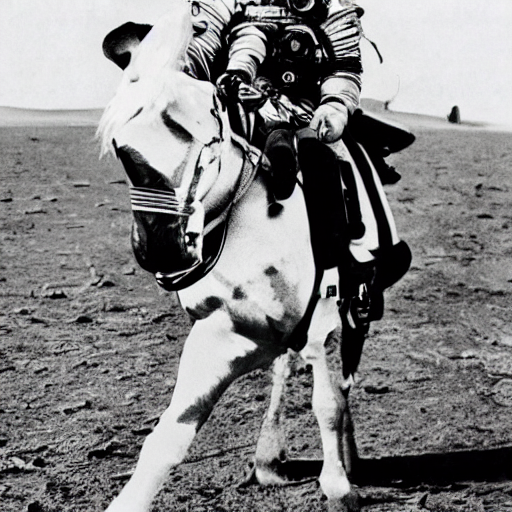

In [ ]:
prompt = "a photograph of an astronaut riding a horse"
image = pipe(prompt).images[0]  # image here is in [PIL format](https://pillow.readthedocs.io/en/stable/)

# Now to display an image you can either save it such as:
image.save(f"astronaut_rides_horse.png")

# or if you're in a google colab you can directly display it with 
image

  0%|          | 0/50 [00:00<?, ?it/s]

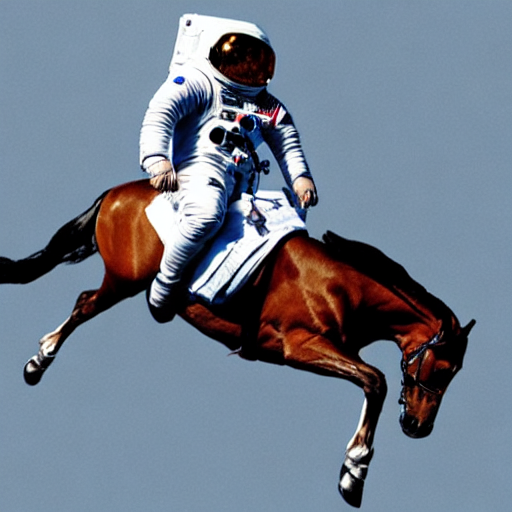

In [ ]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, generator=generator).images[0]

image

In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

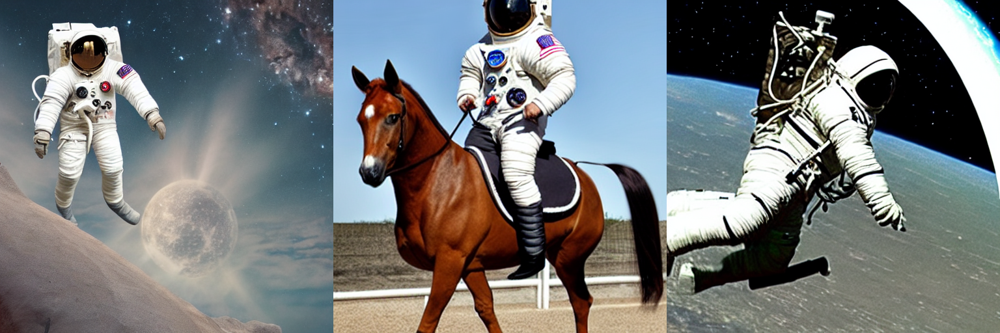

In [ ]:
num_images = 3
prompt = ["a photograph of an astronaut riding a horse"] * num_images

images = pipe(prompt).images

grid = image_grid(images, rows=1, cols=3)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

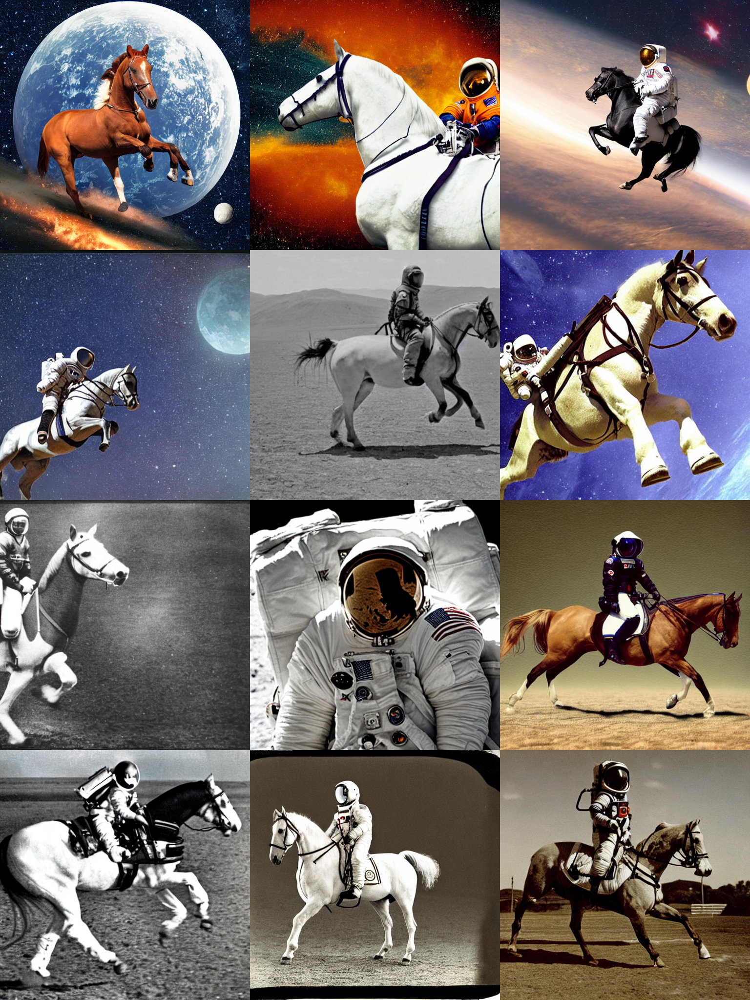

In [ ]:
num_cols = 3
num_rows = 4

prompt = ["a photograph of an astronaut riding a horse"] * num_cols

all_images = []
for i in range(num_rows):
  images = pipe(prompt).images
  all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid